<a href="https://colab.research.google.com/github/htdung167/Face-Mask-Detection/blob/main/Code/FasterRCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**I. Mount Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/CS117/FasterRCNN

/content/drive/MyDrive/CS117/FasterRCNN


#**II. Install Detectron2**

In [ ]:
!pip install pyyaml==5.1
# workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 (issue: https://github.com/facebookresearch/detectron2/issues/3158)
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

# install detectron2 that matches pytorch 1.8
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
#exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 763.5 MB 15 kB/s 
     |████████████████████████████████| 17.3 MB 172 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.8.0+cu101 which is incompatible.
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.3 MB 4.7 MB/s 
     |████████████████████████████████| 130 kB 7.2 MB/s 
     |████████████████████████████████| 49 kB 8.6

#**II. Import**

In [ ]:
%cd /content/drive/MyDrive/CS117/FasterRCNN

/content/drive/MyDrive/CS117/FasterRCNN


In [ ]:
# Kiểm tra cài đặt pytorch, nếu lỗi chạy lại từ đầu 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   

1.8.0+cu101 True


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import numpy as np
import os, json, cv2, random, glob
from google.colab.patches import cv2_imshow
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.config import config as cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.structures import BoxMode
from detectron2.data.datasets import register_coco_instances

#**III. Convert Data: Yolo (txt)-> Coco (json)**

##**1. Download and Unzip Data**

##**2. Convert Function**

In [ ]:
import numpy as np
import os, json, cv2, random, glob

In [ ]:
def get_data_dicts(originLabelsDir, originImagesDir, classes_dir):  
    txtFileList = [f for f in os.listdir(originLabelsDir) if f.endswith('.txt')]
    record = []
    for txtFile in txtFileList:
        print(txtFile)
        try:
            with open(os.path.join(originLabelsDir, txtFile), 'r') as fr:
                labelList = fr.readlines()
                for label in labelList:
                    label = label.strip().split()
                    x = float(label[1])
                    y = float(label[2])
                    w = float(label[3])
                    h = float(label[4])

                    # convert x,y,w,h to x1,y1,x2,y2
                    imgFile = [f for f in os.listdir(originImagesDir) if (f.startswith(txtFile[:-4]) and not f.endswith('.txt'))][0]
                    imagePath = os.path.join(originImagesDir, imgFile)
                    image = cv2.imread(imagePath)
                    H, W, _ = image.shape
                    x1 = (x - w / 2) * W
                    y1 = (y - h / 2) * H
                    x2 = (x + w / 2) * W
                    y2 = (y + h / 2) * H
                    # In order to match the coco label method, the label serial number is calculated from 1
                    # imgFile = [f for f in os.listdir(originImagesDir) if (f.startswith(txtFile[:-4]) and not f.endswith('.txt'))][0]
                    record.append(imgFile + ' {} {} {} {} {}\n'.format(int(label[0]) + 1, x1, y1, x2, y2))
        except:
            print("                  can not read file")
            pass
 ##########################           
        
    # dataset is used to save image information and annotation information of all data
    dataset = {'categories': [], 'annotations': [], 'images': []}
    
    # Open category label
    with open(classes_dir) as f:
        classes = f.read().strip().split()
    
    # Establish the correspondence between category labels and numeric ids

    for i, cls in enumerate(classes, 1):
        dataset['categories'].append({'id': i-1, 'name': cls, 'supercategory': 'mark'})
    
    # Read the image name of the images folder
    indexes = [f for f in os.listdir(originImagesDir) if not f.endswith('.txt')]
    
    # Read Bbox information
    for k, index in enumerate(indexes):
        print("2_" + index)
        im = cv2.imread(originImagesDir + '/' + index)
        height, width, _ = im.shape

        # Add image information to the dataset
        dataset['images'].append({'file_name': index,
                                  'id': k,
                                  'width': width,
                                  'height': height})

        for ii, anno in enumerate(record):
            parts = anno.strip().split()

            # Add a tag if the name of the image and the name of the tag are on
            if parts[0] == index:
                                  # 
                cls_id = parts[1]
                # x_min
                x1 = float(parts[2])
                # y_min
                y1 = float(parts[3])
                # x_max
                x2 = float(parts[4])
                # y_max
                y2 = float(parts[5])
                width = max(0, x2 - x1)
                height = max(0, y2 - y1)
                dataset['annotations'].append({
                    'area': width * height,
                    'bbox': [x1, y1, width, height],
                    'category_id': int(cls_id) - 1,
                    'id': ii,
                    'image_id': k,
                    'iscrowd': 0,
                    'segmentation': [[x1, y1, x2, y1, x2, y2, x1, y2]]
                })
    return dataset

##**3. Create file json**

In [ ]:
%cd /content/drive/MyDrive/CS117/FasterRCNN

/content/drive/MyDrive/CS117/RetinaNet


In [ ]:
train_dicts = get_data_dicts('/content/drive/MyDrive/CS117/Yolo/darknet/data/data/train','/content/drive/MyDrive/CS117/Yolo/darknet/data/data/train', '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/classes.txt')

In [ ]:
with open('train_dicts.json', 'w') as fp1:
    json.dump(train_dicts, fp1)

In [ ]:
val_dicts = get_data_dicts('/content/drive/MyDrive/CS117/Yolo/darknet/data/data/valid','/content/drive/MyDrive/CS117/Yolo/darknet/data/data/valid', '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/classes.txt')

In [ ]:
with open('val_dicts.json', 'w') as fp2:
    json.dump(val_dicts, fp2)

In [ ]:
test_dicts = get_data_dicts('/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test','/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test', '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/classes.txt')

In [ ]:
with open('test_dicts.json', 'w') as fp3:
    json.dump(test_dicts, fp3)

##**4. Read file json**

In [ ]:
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/CS117/RetinaNet/train_dicts.json", "/content/drive/MyDrive/CS117/Yolo/darknet/data/data/train")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/CS117/RetinaNet/val_dicts.json", "/content/drive/MyDrive/CS117/Yolo/darknet/data/data/valid")
register_coco_instances("my_dataset_test", {}, "/content/drive/MyDrive/CS117/RetinaNet/test_dicts.json", "/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test")

AssertionError: ignored

#**IV. Visualize**

WARNING [08/29 03:43:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/29 03:43:48 d2.data.datasets.coco]: Loaded 700 images in COCO format from /content/drive/MyDrive/CS117/RetinaNet/train_dicts.json


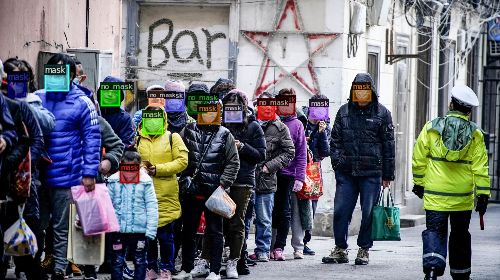

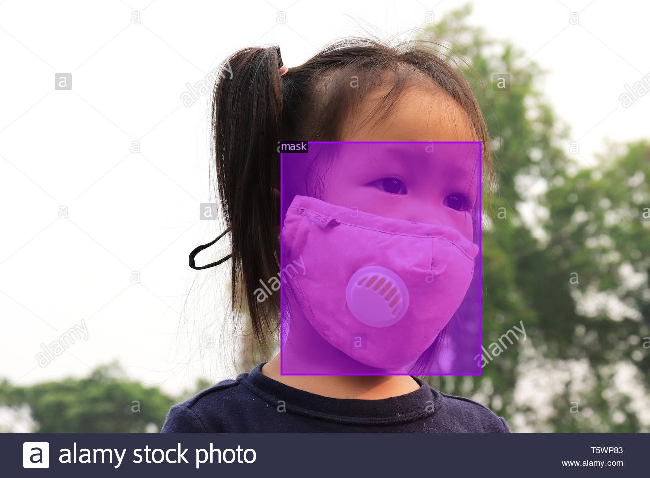

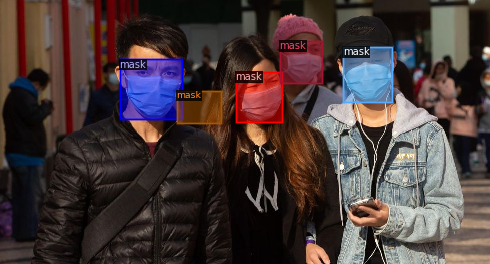

In [ ]:
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

#**V. Train**

In [ ]:
%cd /content/drive/MyDrive/CS117/FasterRCNN

/content/drive/MyDrive/CS117/FasterRCNN


In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
# cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/CS117/FasterRCNN/output/model_final.pth'
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0001  # pick a good LR
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 4800 
cfg.SOLVER.STEPS = []       
cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  
cfg.TEST.EVAL_PERIOD = 500

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[08/29 03:45:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
model_final_68b088.pkl: 421MB [00:06, 60.8MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.b

[08/29 03:45:29 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[08/29 03:45:56 d2.utils.events]:  eta: 1:49:07  iter: 19  total_loss: 1.931  loss_cls: 1.148  loss_box_reg: 0.4667  loss_rpn_cls: 0.2115  loss_rpn_loc: 0.03665  time: 1.3433  data_time: 0.0363  lr: 1.9981e-06  max_mem: 6053M
[08/29 03:46:25 d2.utils.events]:  eta: 1:53:03  iter: 39  total_loss: 1.892  loss_cls: 1.14  loss_box_reg: 0.3371  loss_rpn_cls: 0.2577  loss_rpn_loc: 0.0321  time: 1.4022  data_time: 0.0055  lr: 3.9961e-06  max_mem: 6244M
[08/29 03:46:56 d2.utils.events]:  eta: 1:56:27  iter: 59  total_loss: 1.785  loss_cls: 1.086  loss_box_reg: 0.4651  loss_rpn_cls: 0.1256  loss_rpn_loc: 0.02894  time: 1.4568  data_time: 0.0050  lr: 5.9941e-06  max_mem: 6244M
[08/29 03:47:29 d2.utils.events]:  eta: 1:59:55  iter: 79  total_loss: 1.805  loss_cls: 1.048  loss_box_reg: 0.5064  loss_rpn_cls: 0.1864  loss_rpn_loc: 0.03316  time: 1.4957  data_time: 0.0057  lr: 7.9921e-06  max_mem: 6244M
[08/29 03:48:00 d2.utils.events]:  eta: 1:59:54  iter: 99  total_loss: 1.899  loss_cls: 0.9748  lo

#**VI. Evaluation**

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset


# cfg = get_cfg()
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")

# cfg.DATASETS.TRAIN = ("my_dataset_train",)
# cfg.DATASETS.TEST = ("my_dataset_val",)
# trainer = DefaultTrainer(cfg)


cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [08/29 05:50:09 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [08/29 05:50:09 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/29 05:50:09 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/CS117/RetinaNet/val_dicts.json
[08/29 05:50:09 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/29 05:50:09 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[08/29 05:50:09 d2.data.common]: Serialized dataset takes 0.07 MiB
[08/29 05:50:09 d2.evaluation.evaluator]: Start inference on 100 batches


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[08/29 05:50:16 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0025 s/iter. Inference: 0.2878 s/iter. Eval: 0.0003 s/iter. Total: 0.2906 s/iter. ETA=0:00:25
[08/29 05:50:21 d2.evaluation.evaluator]: Inference done 29/100. Dataloading: 0.0022 s/iter. Inference: 0.2801 s/iter. Eval: 0.0002 s/iter. Total: 0.2827 s/iter. ETA=0:00:20
[08/29 05:50:27 d2.evaluation.evaluator]: Inference done 47/100. Dataloading: 0.0021 s/iter. Inference: 0.2792 s/iter. Eval: 0.0004 s/iter. Total: 0.2819 s/iter. ETA=0:00:14
[08/29 05:50:32 d2.evaluation.evaluator]: Inference done 65/100. Dataloading: 0.0022 s/iter. Inference: 0.2827 s/iter. Eval: 0.0003 s/iter. Total: 0.2854 s/iter. ETA=0:00:09
[08/29 05:50:37 d2.evaluation.evaluator]: Inference done 83/100. Dataloading: 0.0022 s/iter. Inference: 0.2847 s/iter. Eval: 0.0003 s/iter. Total: 0.2873 s/iter. ETA=0:00:04
[08/29 05:50:42 d2.evaluation.evaluator]: Inference done 100/100. Dataloading: 0.0021 s/iter. Inference: 0.2864 s/iter. Eval: 0.00

OrderedDict([('bbox',
              {'AP': 43.55754294174476,
               'AP-mask': 52.70892232486213,
               'AP-no_mask': 34.406163558627384,
               'AP50': 82.41218675352148,
               'AP75': 42.996657353797765,
               'APl': 53.72119687609196,
               'APm': 46.655398708010644,
               'APs': 24.67700492129962})])

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, test_loader, evaluator)

WARNING [08/29 05:50:49 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [08/29 05:50:49 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/29 05:50:49 d2.data.datasets.coco]: Loaded 120 images in COCO format from /content/drive/MyDrive/CS117/RetinaNet/test_dicts.json
[08/29 05:50:49 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|  no_mask   | 154          |    mask    | 475          |
|            |              |            |              |
|   total    | 629          |            |              |
[08/29 05:50:49 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/29 0

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[08/29 05:50:56 d2.evaluation.evaluator]: Inference done 11/120. Dataloading: 0.0010 s/iter. Inference: 0.2784 s/iter. Eval: 0.0002 s/iter. Total: 0.2796 s/iter. ETA=0:00:30
[08/29 05:51:01 d2.evaluation.evaluator]: Inference done 29/120. Dataloading: 0.0019 s/iter. Inference: 0.2765 s/iter. Eval: 0.0002 s/iter. Total: 0.2787 s/iter. ETA=0:00:25
[08/29 05:51:06 d2.evaluation.evaluator]: Inference done 47/120. Dataloading: 0.0021 s/iter. Inference: 0.2805 s/iter. Eval: 0.0002 s/iter. Total: 0.2831 s/iter. ETA=0:00:20
[08/29 05:51:12 d2.evaluation.evaluator]: Inference done 65/120. Dataloading: 0.0022 s/iter. Inference: 0.2829 s/iter. Eval: 0.0002 s/iter. Total: 0.2855 s/iter. ETA=0:00:15
[08/29 05:51:17 d2.evaluation.evaluator]: Inference done 83/120. Dataloading: 0.0022 s/iter. Inference: 0.2845 s/iter. Eval: 0.0002 s/iter. Total: 0.2871 s/iter. ETA=0:00:10
[08/29 05:51:22 d2.evaluation.evaluator]: Inference done 100/120. Dataloading: 0.0022 s/iter. Inference: 0.2869 s/iter. Eval: 0.00

OrderedDict([('bbox',
              {'AP': 47.52706870458732,
               'AP-mask': 56.27597239226444,
               'AP-no_mask': 38.7781650169102,
               'AP50': 87.17509253462696,
               'AP75': 46.94633157880541,
               'APl': 62.402722406708,
               'APm': 49.30863825665088,
               'APs': 39.60521774472268})])

#**VII. Predict Image**

In [ ]:
%cd /content/drive/MyDrive/CS117/FasterRCNN

/content/drive/MyDrive/CS117/FasterRCNN


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

WARNING [08/29 05:56:35 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/29 05:56:35 d2.data.datasets.coco]: Loaded 120 images in COCO format from /content/drive/MyDrive/CS117/RetinaNet/test_dicts.json
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/young-woman-with-luggage-in-international-airport-UEZG6HJ.jpg', 'height': 500, 'width': 750, 'image_id': 98, 'annotations': [{'iscrowd': 0, 'bbox': [238.000125, 61.0, 44.00025000000002, 60.0], 'category_id': 1, 'segmentation': [[238.000125, 61.0, 282.000375, 61.0, 282.000375, 121.0, 238.000125, 121.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
time:  0.3723776340484619


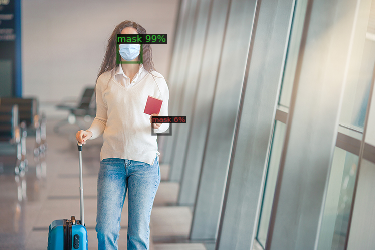

Instances(num_instances=2, image_height=500, image_width=750, fields=[pred_boxes: Boxes(tensor([[234.7229,  69.0208, 282.4079, 124.4560],
        [304.7475, 233.2589, 339.2490, 267.6371]])), scores: tensor([0.9946, 0.0592]), pred_classes: tensor([1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/r1p00017o8171pnq407.jpg', 'height': 959, 'width': 640, 'image_id': 70, 'annotations': [{'iscrowd': 0, 'bbox': [250.00000000000003, 179.00000000000003, 134.00000000000003, 98.00000000000003], 'category_id': 1, 'segmentation': [[250.00000000000003, 179.00000000000003, 384.00000000000006, 179.00000000000003, 384.00000000000006, 277.00000000000006, 250.00000000000003, 277.00000000000006]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
time:  0.29382872581481934


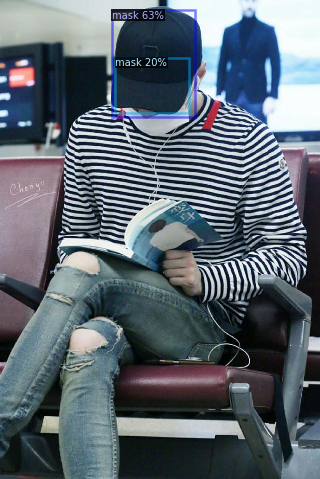

Instances(num_instances=2, image_height=959, image_width=640, fields=[pred_boxes: Boxes(tensor([[224.3904,  21.1772, 389.1852, 235.8881],
        [230.7408, 116.1865, 377.9890, 227.2326]])), scores: tensor([0.6319, 0.2019]), pred_classes: tensor([1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/r1p00017o8357s6sno6.jpg', 'height': 915, 'width': 640, 'image_id': 78, 'annotations': [{'iscrowd': 0, 'bbox': [302.0, 96.00000000000001, 139.0, 148.0], 'category_id': 1, 'segmentation': [[302.0, 96.00000000000001, 441.0, 96.00000000000001, 441.0, 244.0, 302.0, 244.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
time:  0.29293370246887207


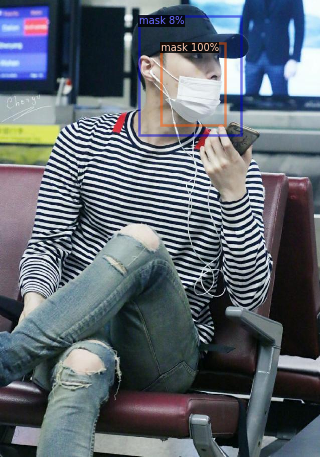

Instances(num_instances=2, image_height=915, image_width=640, fields=[pred_boxes: Boxes(tensor([[321.1057,  86.4989, 449.9049, 251.4703],
        [277.6928,  32.7097, 482.0868, 270.6722]])), scores: tensor([0.9957, 0.0751]), pred_classes: tensor([1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/r1p00017o80q34s9781.jpg', 'height': 959, 'width': 640, 'image_id': 87, 'annotations': [{'iscrowd': 0, 'bbox': [352.0, 177.0, 127.00000000000006, 140.00000000000006], 'category_id': 1, 'segmentation': [[352.0, 177.0, 479.00000000000006, 177.0, 479.00000000000006, 317.00000000000006, 352.0, 317.00000000000006]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [63.0, 186.0, 69.0, 67.0], 'category_id': 0, 'segmentation': [[63.0, 186.0, 132.0, 186.0, 132.0, 253.0, 63.0, 253.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}
time:  0.30185794830322266


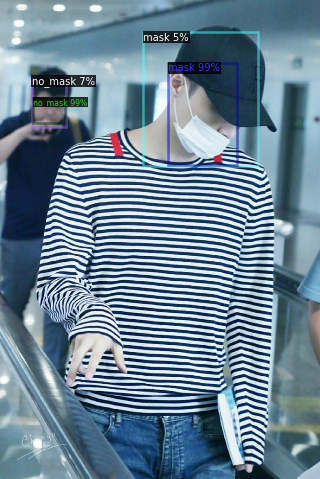

Instances(num_instances=4, image_height=959, image_width=640, fields=[pred_boxes: Boxes(tensor([[336.6917, 126.6988, 473.3217, 330.1082],
        [ 66.6196, 196.4588, 129.3995, 247.3756],
        [ 64.2403, 152.5133, 131.4608, 254.3340],
        [286.9210,  65.2672, 515.4692, 332.0133]])), scores: tensor([0.9936, 0.9934, 0.0655, 0.0544]), pred_classes: tensor([1, 0, 0, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/people-waiting-at-bus-stop-ashgabat-turkmenistan-B4X2H9.jpg', 'height': 991, 'width': 1300, 'image_id': 74, 'annotations': [{'iscrowd': 0, 'bbox': [1202.0008, 212.99959399999997, 53.99940000000015, 73.99995199999998], 'category_id': 0, 'segmentation': [[1202.0008, 212.99959399999997, 1256.0002000000002, 212.99959399999997, 1256.0002000000002, 286.99954599999995, 1202.0008, 286.99954599999995]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [777.0008999999999, 258.0004085, 53.99940000000015, 63.99977100000001], 'category_id': 0, 's

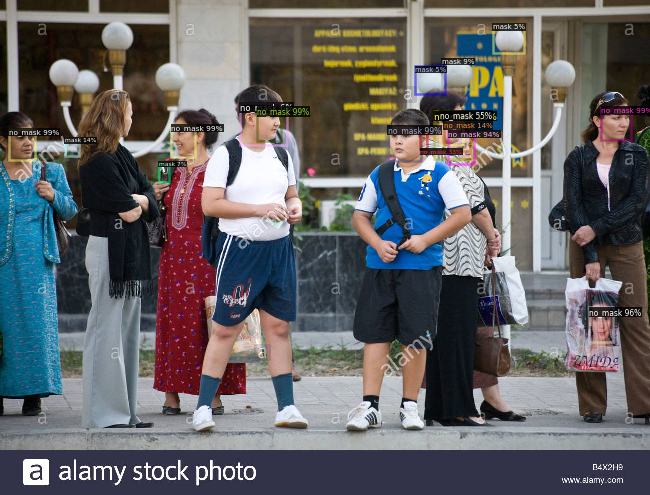

Instances(num_instances=17, image_height=991, image_width=1300, fields=[pred_boxes: Boxes(tensor([[  18.3221,  258.1524,   69.1847,  321.4220],
        [ 514.8005,  215.1261,  562.9761,  283.8984],
        [ 776.0630,  252.0040,  841.2366,  323.3226],
        [1202.8817,  215.2517, 1261.9281,  280.5721],
        [ 342.4751,  250.9588,  389.9020,  315.7359],
        [1178.9482,  615.7523, 1226.6982,  684.2554],
        [ 896.9254,  262.0284,  947.4788,  328.0752],
        [ 880.1570,  223.1853,  925.0028,  291.8413],
        [ 840.5155,  266.7240,  854.8298,  298.2112],
        [ 129.2848,  276.9271,  157.9418,  313.3287],
        [ 887.5388,  245.3423,  939.3041,  303.7815],
        [ 867.2585,  223.7588,  943.2662,  319.4891],
        [ 883.4411,  118.0709,  945.3209,  178.9022],
        [ 317.7255,  324.5466,  337.8459,  365.9652],
        [ 479.2290,  207.0768,  573.4789,  290.6259],
        [ 830.7278,  133.9400,  888.9974,  189.3154],
        [ 986.3301,   48.7618, 1048.9092,  107

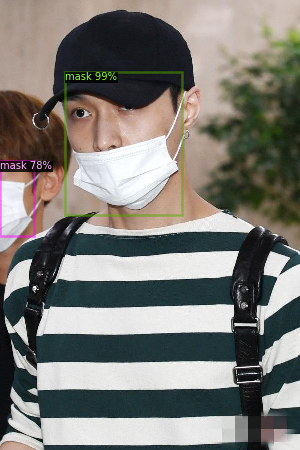

Instances(num_instances=2, image_height=900, image_width=600, fields=[pred_boxes: Boxes(tensor([[130.8088, 144.7824, 364.8791, 429.5811],
        [  0.0000, 322.4741,  67.9223, 472.8508]])), scores: tensor([0.9948, 0.7814]), pred_classes: tensor([1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/w1240-p16x9-coronavirus_CHINA-HEALTH.jpg', 'height': 698, 'width': 1240, 'image_id': 105, 'annotations': [{'iscrowd': 0, 'bbox': [247.0, 120.99999999999999, 31.0, 33.000000000000014], 'category_id': 1, 'segmentation': [[247.0, 120.99999999999999, 278.0, 120.99999999999999, 278.0, 154.0, 247.0, 154.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [295.0, 40.99999999999999, 43.0, 39.00000000000001], 'category_id': 1, 'segmentation': [[295.0, 40.99999999999999, 338.0, 40.99999999999999, 338.0, 80.0, 295.0, 80.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [729.9999999999999, 74.0, 78.00000000000011, 79.0], 'category_id': 1, 'segmenta

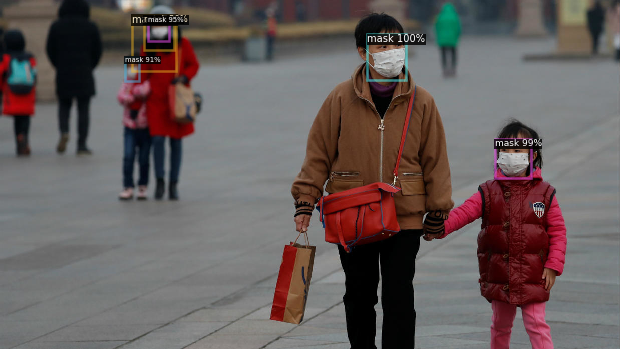

Instances(num_instances=6, image_height=698, image_width=1240, fields=[pred_boxes: Boxes(tensor([[ 734.5351,   68.5155,  811.0865,  159.9043],
        [ 989.1831,  278.6716, 1061.1317,  356.2206],
        [ 295.8068,   34.2206,  338.6552,   81.1229],
        [ 249.3391,  114.1480,  277.9305,  161.1201],
        [ 288.2611,   30.7293,  347.3174,  100.3480],
        [ 263.8537,   30.0809,  352.4858,  141.7682]])), scores: tensor([0.9963, 0.9929, 0.9534, 0.9142, 0.3020, 0.0526]), pred_classes: tensor([1, 1, 1, 1, 1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/nqn000p326o7525q707.jpg', 'height': 960, 'width': 640, 'image_id': 40, 'annotations': [{'iscrowd': 0, 'bbox': [211.0, 461.0, 145.0, 157.0], 'category_id': 0, 'segmentation': [[211.0, 461.0, 356.0, 461.0, 356.0, 618.0, 211.0, 618.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [595.0, 717.0, 44.0, 119.0], 'category_id': 0, 'segmentation': [[595.0, 717.0, 639.0, 717.0, 639.0, 836.0, 59

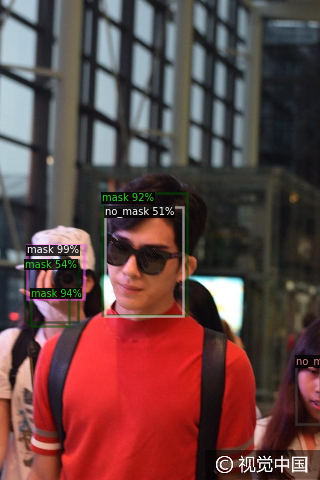

Instances(num_instances=6, image_height=960, image_width=640, fields=[pred_boxes: Boxes(tensor([[ 54.0992, 490.9355, 167.3957, 598.8532],
        [592.0729, 712.1386, 640.0000, 848.7884],
        [ 61.1189, 577.2686, 137.1005, 652.5051],
        [204.0009, 386.1869, 374.5858, 630.1068],
        [ 50.1662, 519.5934, 155.1024, 643.9769],
        [209.1298, 413.0597, 365.6051, 632.5730]])), scores: tensor([0.9915, 0.9441, 0.9423, 0.9157, 0.5383, 0.5081]), pred_classes: tensor([1, 0, 1, 1, 1, 0])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/ST_20190917_SPTHAZE_5120715.jpg', 'height': 520, 'width': 780, 'image_id': 60, 'annotations': [{'iscrowd': 0, 'bbox': [37.99999999999999, 103.00000000000001, 135.0, 127.00000000000001], 'category_id': 1, 'segmentation': [[37.99999999999999, 103.00000000000001, 173.0, 103.00000000000001, 173.0, 230.00000000000003, 37.99999999999999, 230.00000000000003]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [319.0000000

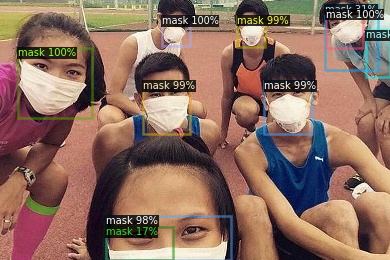

Instances(num_instances=10, image_height=520, image_width=780, fields=[pred_boxes: Boxes(tensor([[651.1890,  19.5940, 726.2601,  95.2832],
        [ 35.7733,  96.0960, 183.4062, 235.9672],
        [323.2145,  31.7665, 379.1230,  92.2892],
        [474.9280,  31.5344, 529.1846,  93.8579],
        [285.7978, 162.2845, 380.8110, 268.7274],
        [528.6075, 161.9356, 624.8988, 267.9684],
        [212.0143, 431.8596, 461.0200, 520.0000],
        [650.3403,   9.6000, 756.0551, 140.0504],
        [211.4479, 454.6812, 345.6469, 520.0000],
        [731.8661,  60.8222, 779.9700, 153.8415]])), scores: tensor([0.9969, 0.9960, 0.9955, 0.9948, 0.9944, 0.9939, 0.9847, 0.3051, 0.1673,
        0.0622]), pred_classes: tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/PHOTriZgIKIgsnNLdBJG75vj200203_1000x2000.jpg', 'height': 607, 'width': 900, 'image_id': 2, 'annotations': [{'iscrowd': 0, 'bbox': [208.0, 74.0, 57.99999999999994, 61.0], 'cate

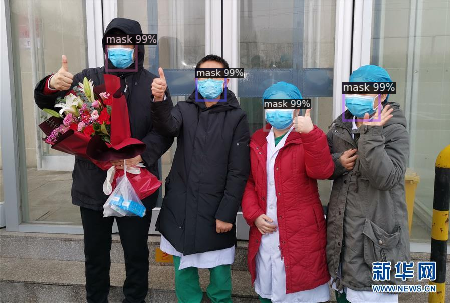

Instances(num_instances=4, image_height=607, image_width=900, fields=[pred_boxes: Boxes(tensor([[211.3725,  70.2735, 272.2797, 141.6095],
        [391.7130, 138.1389, 450.3629, 201.1926],
        [528.6472, 200.4599, 591.1984, 261.2521],
        [685.6476, 166.8304, 758.7144, 240.0856]])), scores: tensor([0.9947, 0.9939, 0.9924, 0.9905]), pred_classes: tensor([1, 1, 1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/Pakistan-China-coronavirus-92news.jpg', 'height': 550, 'width': 900, 'image_id': 6, 'annotations': [{'iscrowd': 0, 'bbox': [27.000000000000004, 188.0, 32.0, 48.0], 'category_id': 1, 'segmentation': [[27.000000000000004, 188.0, 59.00000000000001, 188.0, 59.00000000000001, 236.0, 27.000000000000004, 236.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [98.0, 127.00000000000001, 36.0, 43.999999999999986], 'category_id': 1, 'segmentation': [[98.0, 127.00000000000001, 134.0, 127.00000000000001, 134.0, 171.0, 98.0, 171.0]], 'bbox_mode

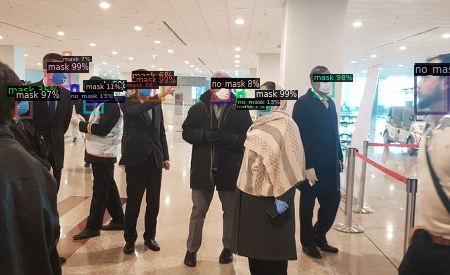

Instances(num_instances=22, image_height=550, image_width=900, fields=[pred_boxes: Boxes(tensor([[512.1715, 180.6980, 542.7785, 226.5994],
        [272.6552, 152.6640, 308.0899, 196.3670],
        [ 95.6399, 126.3056, 137.7263, 171.3692],
        [627.5215, 149.9639, 665.3419, 191.4367],
        [424.4586, 156.9885, 460.6751, 204.1394],
        [ 31.0535, 182.5579,  62.4891, 234.0705],
        [171.2407, 170.3397, 201.4551, 208.3839],
        [251.9399, 165.9040, 272.3293, 193.8616],
        [142.4719, 169.7030, 155.4022, 188.4468],
        [474.7229, 183.9433, 486.1705, 199.1655],
        [829.8826, 131.4268, 896.8070, 226.6651],
        [830.7819, 127.4369, 889.5205, 223.0228],
        [ 15.1261, 172.8649,  61.0253, 239.9404],
        [142.6626, 171.2827, 154.6492, 186.4238],
        [475.6267, 185.6375, 484.9371, 198.2580],
        [171.2588, 168.0265, 191.5396, 199.6931],
        [172.5372, 169.8041, 189.2219, 193.1006],
        [424.0409, 157.7078, 458.3703, 200.3628],
        [47

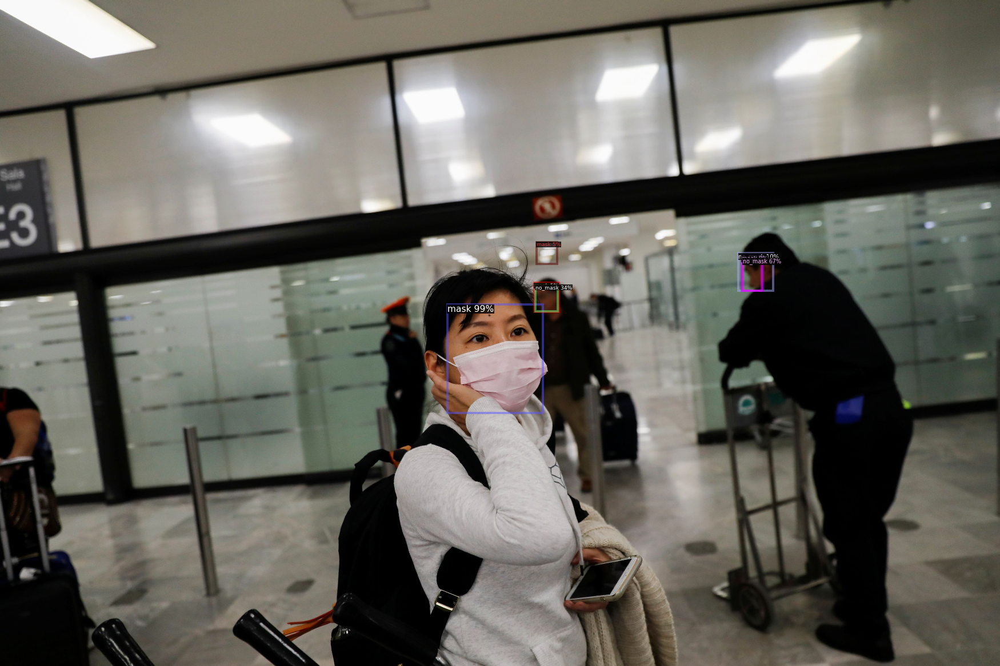

Instances(num_instances=7, image_height=2333, image_width=3500, fields=[pred_boxes: Boxes(tensor([[1565.8953, 1067.8297, 1900.1409, 1447.0437],
        [2599.1570,  905.1750, 2665.2939, 1018.2816],
        [1873.7832,  997.5710, 1951.9458, 1090.2933],
        [2584.8867,  887.4493, 2705.6567, 1018.2223],
        [2596.1099,  896.6848, 2669.4160, 1018.1111],
        [1870.1780,  991.9182, 1955.3320, 1092.6299],
        [1877.7769,  848.1210, 1949.2078,  924.0822]])), scores: tensor([0.9935, 0.6719, 0.3384, 0.0993, 0.0808, 0.0520, 0.0514]), pred_classes: tensor([1, 0, 0, 0, 1, 1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/P0000100005637_3_37742.jpg', 'height': 1000, 'width': 1000, 'image_id': 4, 'annotations': [{'iscrowd': 0, 'bbox': [221.00000000000003, 523.0, 226.99999999999997, 233.0000000000001], 'category_id': 1, 'segmentation': [[221.00000000000003, 523.0, 448.0, 523.0, 448.0, 756.0000000000001, 221.00000000000003, 756.0000000000001]], 'bbox_mode'

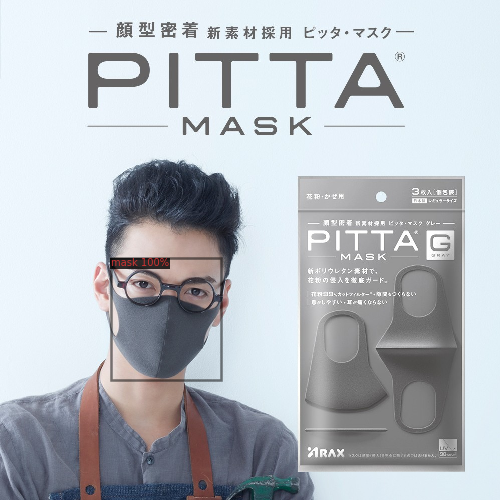

Instances(num_instances=1, image_height=1000, image_width=1000, fields=[pred_boxes: Boxes(tensor([[222.0832, 516.9758, 442.6096, 759.3651]])), scores: tensor([0.9970]), pred_classes: tensor([1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/remote (1).jpeg', 'height': 690, 'width': 920, 'image_id': 22, 'annotations': []}
time:  0.28370189666748047


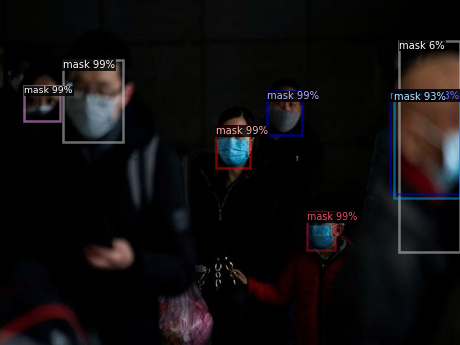

Instances(num_instances=8, image_height=690, image_width=920, fields=[pred_boxes: Boxes(tensor([[534.2220, 182.8478, 603.2138, 269.4440],
        [613.5289, 424.9112, 669.3334, 499.6115],
        [432.1928, 251.9994, 500.1932, 336.6492],
        [ 48.7954, 172.8605, 120.6396, 242.2565],
        [125.9599, 120.2314, 245.4684, 284.8235],
        [787.6801, 183.1929, 920.0000, 396.9104],
        [779.5262, 180.0920, 920.0000, 387.1310],
        [798.8718,  81.2206, 920.0000, 504.9310]])), scores: tensor([0.9947, 0.9928, 0.9927, 0.9889, 0.9887, 0.9315, 0.3281, 0.0557]), pred_classes: tensor([1, 1, 1, 1, 1, 1, 0, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/sdgdsgsg.jpg', 'height': 768, 'width': 768, 'image_id': 52, 'annotations': [{'iscrowd': 0, 'bbox': [0.0, 252.0, 111.0, 158.0], 'category_id': 1, 'segmentation': [[0.0, 252.0, 111.0, 252.0, 111.0, 410.0, 0.0, 410.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [265.0, 244.00000000000003, 1

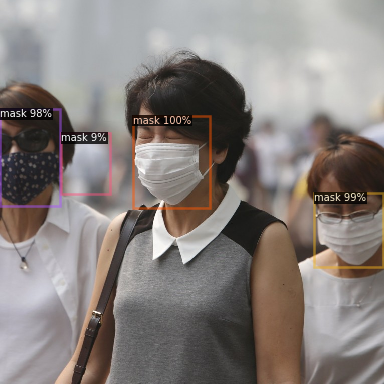

Instances(num_instances=4, image_height=768, image_width=768, fields=[pred_boxes: Boxes(tensor([[266.0943, 231.2678, 419.6162, 416.2110],
        [628.5889, 386.1305, 765.5029, 534.4064],
        [  0.0000, 218.0102, 119.9707, 411.5395],
        [122.5534, 265.9895, 219.4608, 387.6530]])), scores: tensor([0.9962, 0.9946, 0.9832, 0.0904]), pred_classes: tensor([1, 1, 1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/the-first-day-of-wuhan-s-closure-some-people-fled-some-panicked.jpg', 'height': 578, 'width': 1024, 'image_id': 107, 'annotations': [{'iscrowd': 0, 'bbox': [29.0, 147.0, 84.0, 71.0], 'category_id': 1, 'segmentation': [[29.0, 147.0, 113.0, 147.0, 113.0, 218.0, 29.0, 218.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [342.0, 134.0, 75.0, 76.0], 'category_id': 1, 'segmentation': [[342.0, 134.0, 417.0, 134.0, 417.0, 210.0, 342.0, 210.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [433.0, 226.0, 31.0, 35.0], 'cate

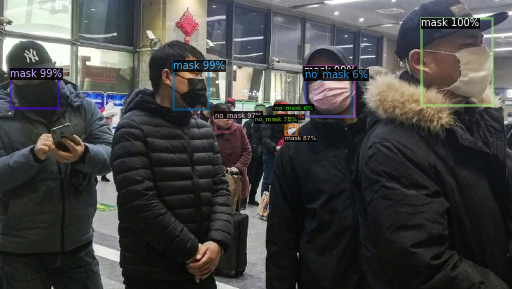

Instances(num_instances=12, image_height=578, image_width=1024, fields=[pred_boxes: Boxes(tensor([[842.7636,  36.7384, 984.2872, 209.3721],
        [ 20.8724, 138.0910, 116.2603, 215.8395],
        [346.8067, 122.3170, 415.3747, 217.9090],
        [607.6234, 132.5855, 707.2062, 232.3707],
        [430.1136, 224.1391, 463.0430, 261.7482],
        [548.1997, 210.7787, 571.0996, 237.2603],
        [570.0401, 251.0102, 591.0803, 272.8911],
        [510.3441, 214.8232, 527.8376, 232.2803],
        [509.1225, 214.2027, 528.4010, 235.6479],
        [554.1755, 206.8094, 572.0495, 228.7352],
        [549.7857, 209.7079, 571.1899, 234.9656],
        [610.0109, 139.0519, 702.4566, 231.5386]])), scores: tensor([0.9952, 0.9945, 0.9876, 0.9867, 0.9733, 0.9385, 0.8708, 0.7804, 0.3193,
        0.0907, 0.0594, 0.0587]), pred_classes: tensor([1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/shutterstock_584407723.jpg', 'height': 667, 'width':

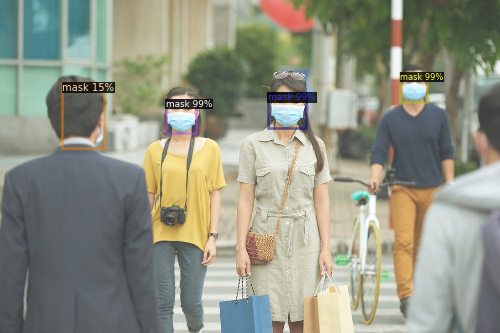

Instances(num_instances=4, image_height=667, image_width=1000, fields=[pred_boxes: Boxes(tensor([[536.3257, 186.8605, 611.6315, 256.8896],
        [331.3874, 200.2066, 392.1470, 267.6553],
        [800.7687, 146.3475, 853.6520, 205.9620],
        [124.6050, 166.1091, 207.5718, 297.6954]])), scores: tensor([0.9940, 0.9935, 0.9934, 0.1462]), pred_classes: tensor([1, 1, 1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/TASS38012699.jpg', 'height': 765, 'width': 1360, 'image_id': 41, 'annotations': [{'iscrowd': 0, 'bbox': [575.0, 144.0, 84.0, 87.0], 'category_id': 1, 'segmentation': [[575.0, 144.0, 659.0, 144.0, 659.0, 231.0, 575.0, 231.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [120.99999999999999, 333.99999999999994, 59.000000000000014, 51.00000000000006], 'category_id': 0, 'segmentation': [[120.99999999999999, 333.99999999999994, 180.0, 333.99999999999994, 180.0, 385.0, 120.99999999999999, 385.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>},

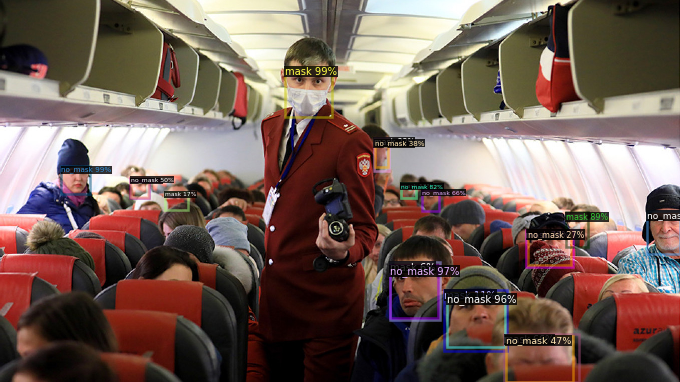

Instances(num_instances=20, image_height=765, image_width=1360, fields=[pred_boxes: Boxes(tensor([[ 569.6277,  134.0799,  663.3133,  235.5157],
        [ 122.9619,  333.4818,  179.8741,  389.9773],
        [ 779.7475,  531.4724,  875.2323,  636.2830],
        [1294.3997,  422.8606, 1359.0449,  508.9679],
        [ 893.2393,  588.1135, 1010.4292,  695.1873],
        [1131.6110,  425.8007, 1176.1400,  494.9636],
        [ 802.3876,  367.7491,  831.8989,  396.1862],
        [1052.9143,  461.0410, 1145.4447,  535.3152],
        [ 843.5753,  380.5187,  877.2737,  422.3205],
        [1008.6430,  669.5568, 1157.8673,  765.0000],
        [ 261.1553,  354.6780,  296.0376,  394.2672],
        [1011.7594,  672.8099, 1145.7277,  765.0000],
        [ 749.9102,  280.6183,  776.6866,  335.6937],
        [ 260.8234,  357.4334,  297.1610,  396.9477],
        [1055.1125,  460.9167, 1142.1794,  531.2426],
        [ 748.0665,  276.6817,  778.3076,  342.6866],
        [ 329.4339,  384.8304,  375.6097,  420

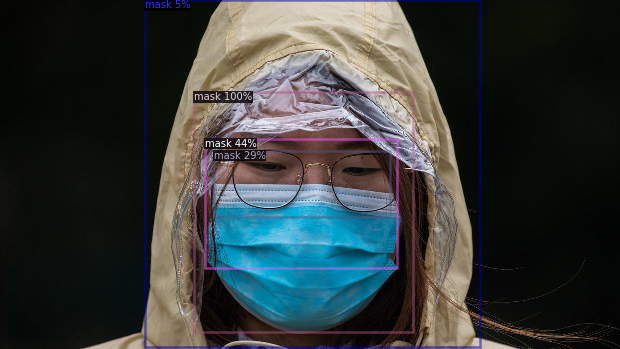

Instances(num_instances=4, image_height=698, image_width=1240, fields=[pred_boxes: Boxes(tensor([[388.0724, 184.3508, 826.8683, 664.4064],
        [409.9741, 277.4555, 794.5563, 536.9743],
        [427.1734, 301.2733, 780.9317, 434.7122],
        [289.3944,   0.0000, 959.9376, 693.2535]])), scores: tensor([0.9962, 0.4448, 0.2912, 0.0543]), pred_classes: tensor([1, 1, 1, 1])])
{'file_name': '/content/drive/MyDrive/CS117/Yolo/darknet/data/data/test/shutterstock_289132226.jpg', 'height': 667, 'width': 1000, 'image_id': 36, 'annotations': [{'iscrowd': 0, 'bbox': [205.0, 138.00000000000003, 86.0, 97.99999999999997], 'category_id': 1, 'segmentation': [[205.0, 138.00000000000003, 291.0, 138.00000000000003, 291.0, 236.0, 205.0, 236.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [446.0, 126.0, 82.0, 88.0], 'category_id': 1, 'segmentation': [[446.0, 126.0, 528.0, 126.0, 528.0, 214.0, 446.0, 214.0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [656.0, 153.0, 79.0

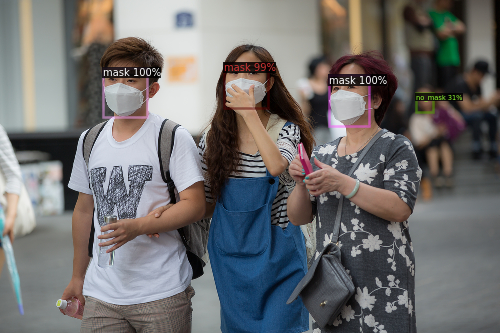

Instances(num_instances=4, image_height=667, image_width=1000, fields=[pred_boxes: Boxes(tensor([[205.2157, 136.3579, 294.8040, 235.7393],
        [657.2392, 151.0634, 737.4733, 253.5453],
        [447.1913, 126.1920, 535.6733, 217.1654],
        [832.2119, 187.7672, 866.1257, 225.3256]])), scores: tensor([0.9952, 0.9952, 0.9905, 0.3108]), pred_classes: tensor([1, 1, 1, 0])])


In [ ]:
from detectron2.utils.visualizer import ColorMode
import time
dataset_dicts = DatasetCatalog.get("my_dataset_test")
my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
total_time=0
for d in random.sample(dataset_dicts, 20):    
    print(d)
    im = cv2.imread(d["file_name"])
    t0 = time.time()
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    t1 = time.time()
    print("time: ", t1-t0)
    total_time += (t1-t0)
    v = Visualizer(im[:, :, ::-1],
                  #  metadata=signs_metadata_val, 
                   metadata=my_dataset_test_metadata,
                   scale=0.5, 
                  # instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
    print(outputs["instances"].to("cpu"))


In [ ]:
total_time / 20

0.30441359281539915

#**VIII. Predict Video**

In [ ]:
%cd /content/drive/MyDrive/CS117/FasterRCNN

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

In [ ]:
import tqdm
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
import time

In [ ]:
# Extract video properties
video = cv2.VideoCapture('/content/drive/MyDrive/CS114/Dien/video/video_test.mp4')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Initialize video writer
video_writer = cv2.VideoWriter('video_night_train4_0dot5.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

# # Initialize predictor
# cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.7  # set threshold for this model
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
# predictor = DefaultPredictor(cfg)



# Initialize visualizer
v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)

def runOnVideo(video, maxFrames):
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """

    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame)

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

# Create a cut-off for debugging
num_frames = 8000

# Enumerate the frames of the video
for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

    # Write test image
    cv2.imwrite('POSE detectron2.png', visualization)

    # Write to video file
    video_writer.write(visualization)

# Release resources
video.release()
video_writer.release()
cv2.destroyAllWindows()